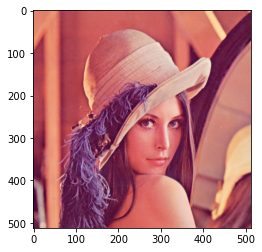

In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
image = Image.open("lenna.png")
plt.imshow(image)
plt.show()

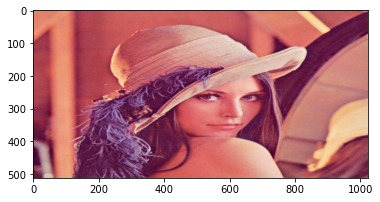

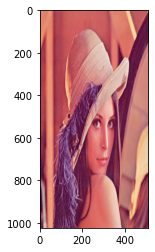

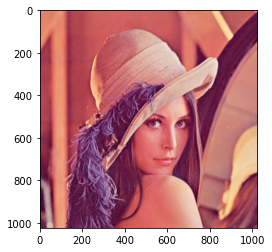

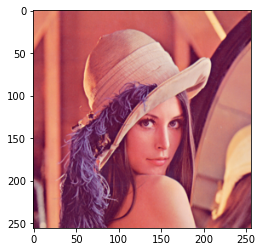

In [2]:
width, height = image.size
new_width = 2 * width
new_hight = height
new_image = image.resize((new_width, new_hight))
plt.imshow(new_image)
plt.show()

new_width = width
new_hight = 2 * height
new_image = image.resize((new_width, new_hight))
plt.imshow(new_image)
plt.show()

new_width = 2 * width
new_hight = 2 * height
new_image = image.resize((new_width, new_hight))
plt.imshow(new_image)
plt.show()

new_width = width // 2
new_hight = height // 2
new_image = image.resize((new_width, new_hight))
plt.imshow(new_image)
plt.show()

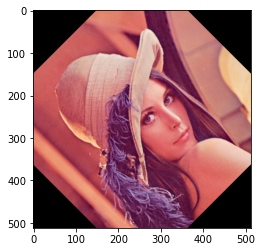

In [3]:
theta = 45
new_image = image.rotate(theta)
plt.imshow(new_image)
plt.show()

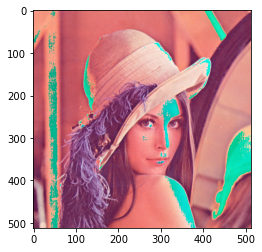

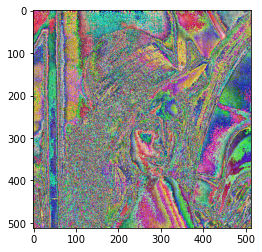

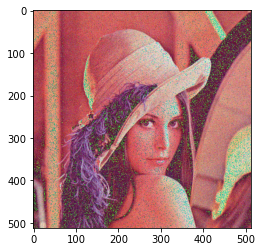

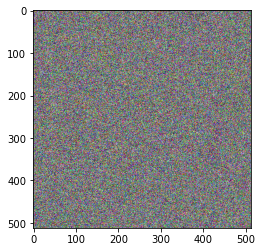

In [4]:
image = np.array(image)

new_image = image + 20
plt.imshow(new_image)
plt.show()

new_image = 10 * image
plt.imshow(new_image)
plt.show()

Noise = np.random.normal(0, 20, (height, width, 3)).astype(np.uint8)
Noise.shape

new_image = image + Noise
plt.imshow(new_image)
plt.show()

new_image = image*Noise
plt.imshow(new_image)
plt.show()

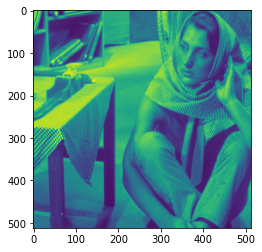

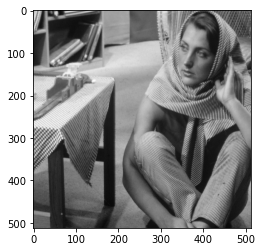

In [5]:
im_gray = Image.open("barbara.png")
plt.imshow(im_gray)
plt.show()

from PIL import ImageOps 

im_gray = ImageOps.grayscale(im_gray)
im_gray = np.array(im_gray)
plt.imshow(im_gray,cmap='gray')
plt.show()

In [6]:
U, s, V = np.linalg.svd(im_gray, full_matrices = True)

In [7]:
s.shape

(512,)

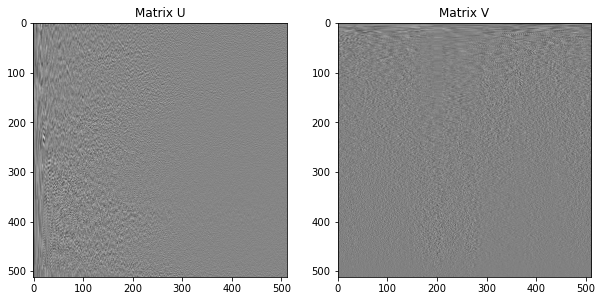

In [8]:
S = np.zeros((im_gray.shape[0], im_gray.shape[1]))
S[:image.shape[0], :image.shape[0]] = np.diag(s)

def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(image_1,cmap="gray")
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(image_2,cmap="gray")
    plt.title(title_2)
    plt.show()

plot_image(U, V, title_1 = "Matrix U", title_2 = "Matrix V")

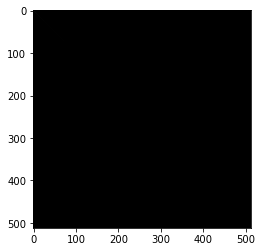

In [9]:
plt.imshow(S, cmap='gray')
plt.show()

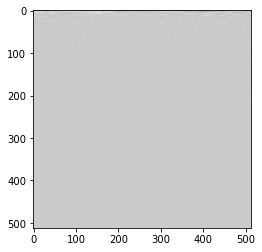

In [10]:
B = S.dot(V)
plt.imshow(B,cmap='gray')
plt.show()

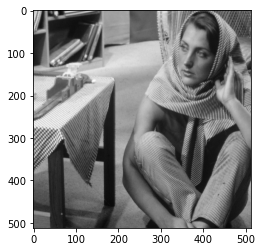

In [11]:
A = U.dot(B)
plt.imshow(A,cmap='gray')
plt.show()

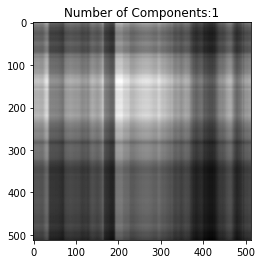

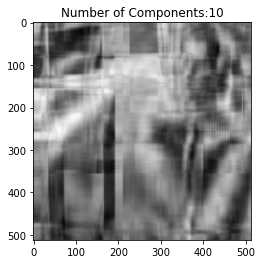

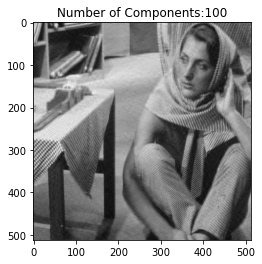

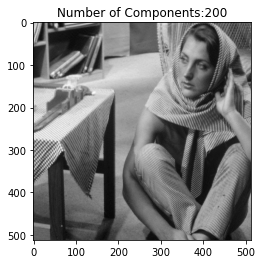

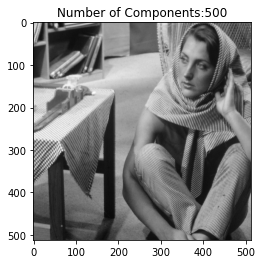

In [12]:
for n_component in [1,10,100,200, 500]:
    S_new = S[:, :n_component]
    V_new = V[:n_component, :]
    A = U.dot(S_new.dot(V_new))
    plt.imshow(A,cmap='gray')
    plt.title("Number of Components:"+str(n_component))
    plt.show()

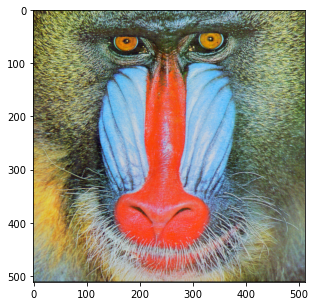

In [13]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5))
plt.imshow(baboon)
plt.show()

In [14]:
A = baboon
id(A) == id(baboon)

True

In [15]:
B = baboon.copy()
id(B)==id(baboon)

False

In [16]:
baboon[:,:,] = 0

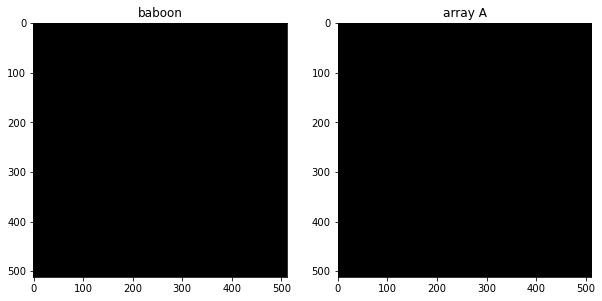

In [17]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

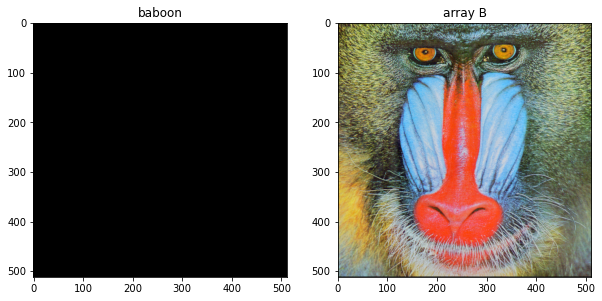

In [18]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()

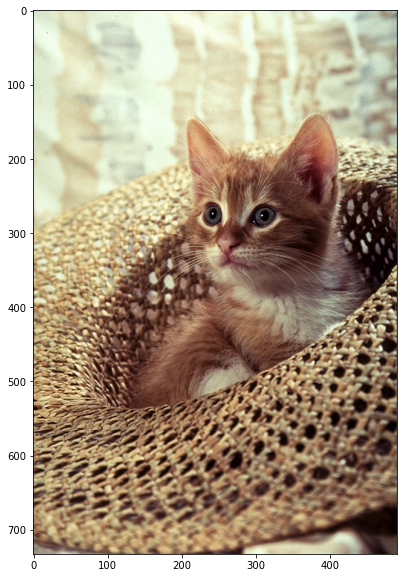

In [19]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [20]:
array = np.array(image)
width, height, C = array.shape
print('width, height, C', width, height, C)

width, height, C 733 490 3


In [21]:
array_flip = np.zeros((width, height, C), dtype=np.uint8)

In [22]:
for i,row in enumerate(array):
    array_flip[width - 1 - i, :, :] = row

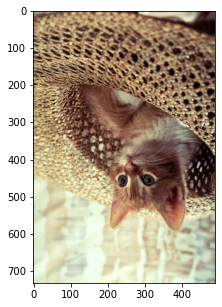

In [23]:
from PIL import ImageOps
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

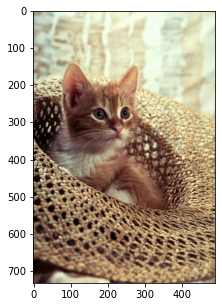

In [24]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

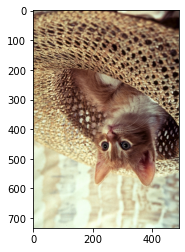

In [25]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

In [26]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE, 
        "TRANSVERSE": Image.TRANSVERSE}

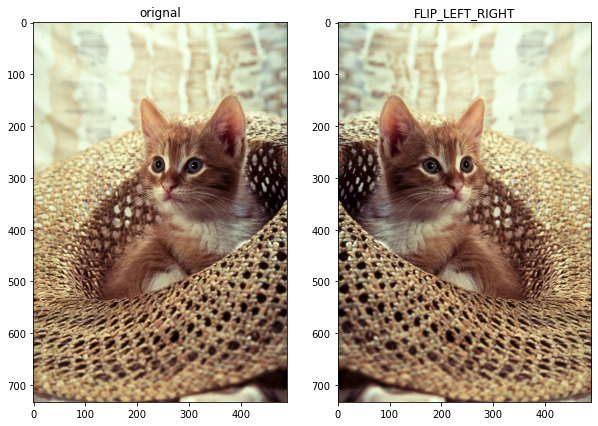

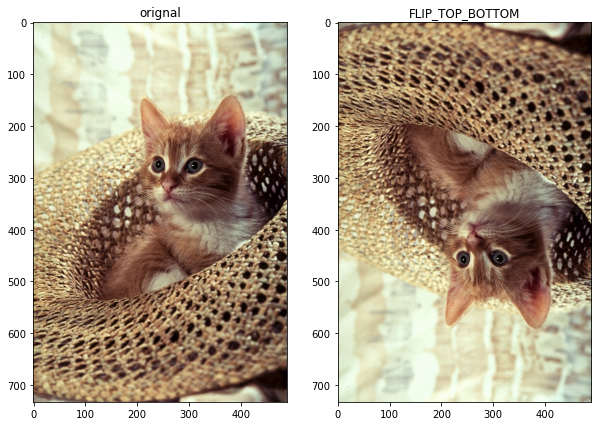

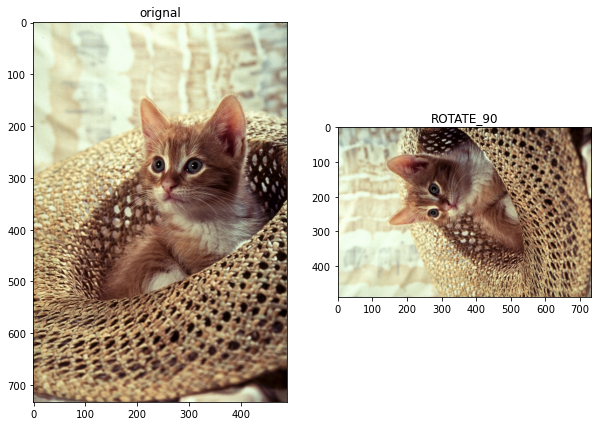

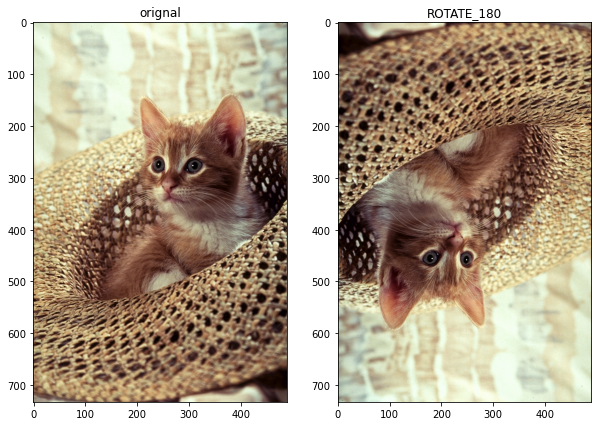

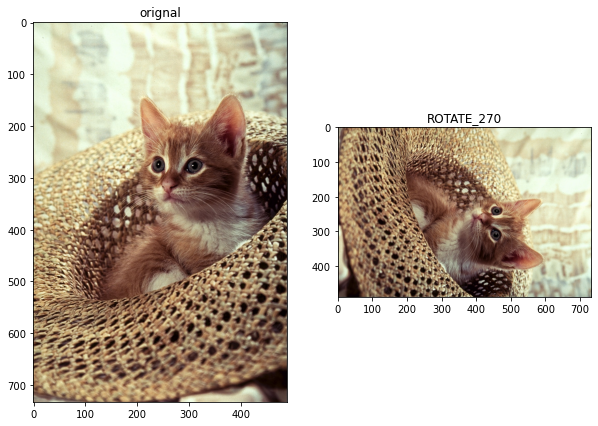

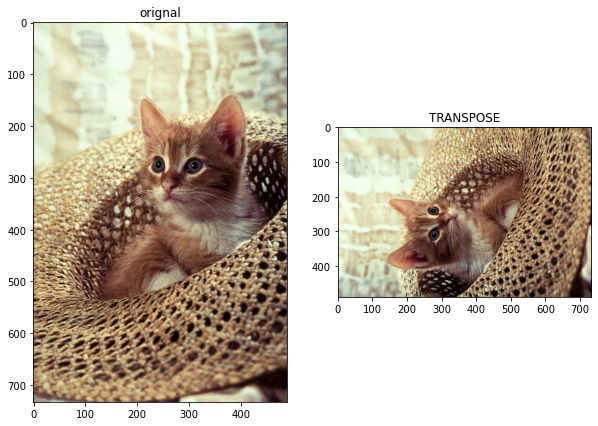

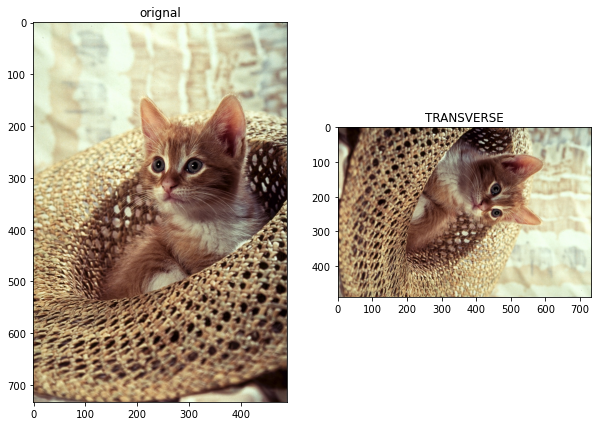

In [27]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

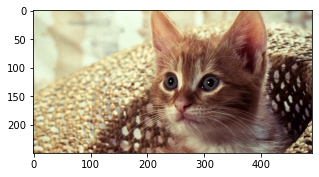

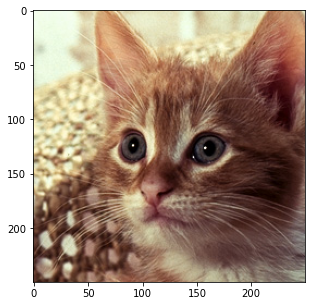

In [28]:
upper = 150
lower = 400
crop_top = array[upper: lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

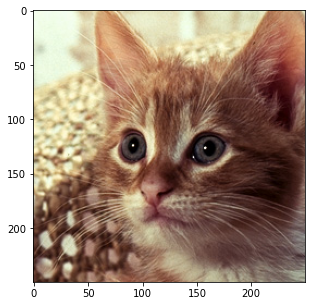

In [29]:
image = Image.open("cat.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

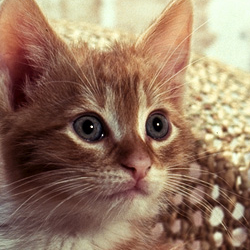

In [30]:
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

In [31]:
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:2] = 0

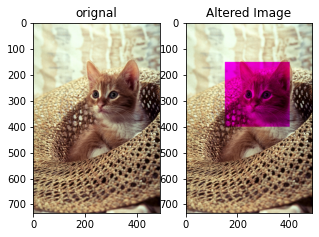

In [32]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

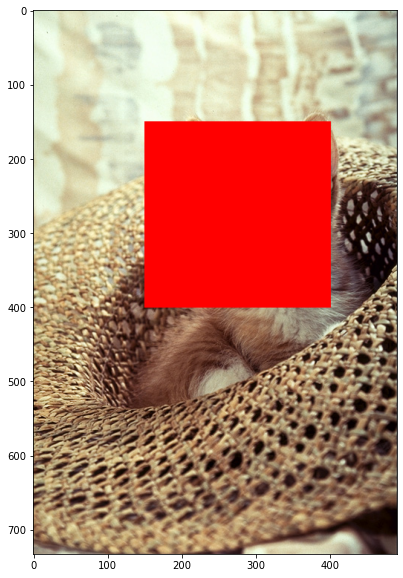

In [33]:
from PIL import ImageDraw 

image_draw = image.copy()
image_fn = ImageDraw.Draw(im=image_draw)

shape = [left, upper, right, lower] 
image_fn.rectangle(xy=shape,fill="red")
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

In [34]:
from PIL import ImageFont
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))

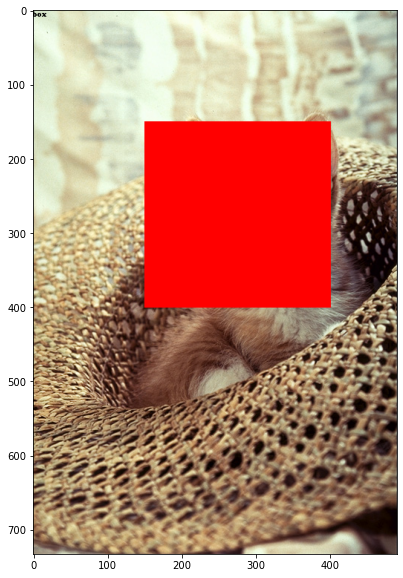

In [35]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

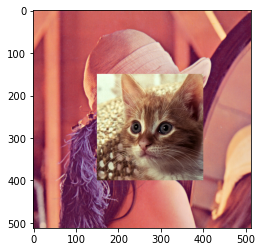

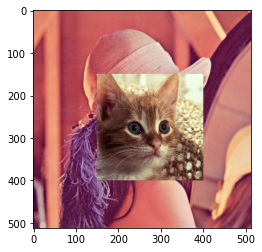

In [36]:
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

image_lenna.paste(crop_image, box=(left,upper))
plt.imshow(image_lenna)
plt.show()

In [37]:
image = Image.open("cat.png")
new_image=image
copy_image=image.copy()

In [38]:
id(image)==id(new_image)

True

In [39]:
id(image)==id(copy_image)

False

In [40]:
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

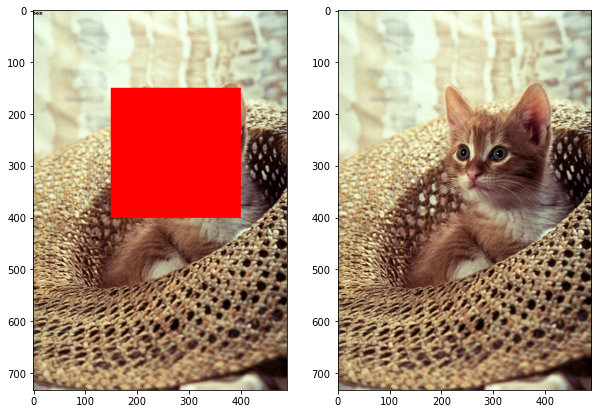

In [41]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

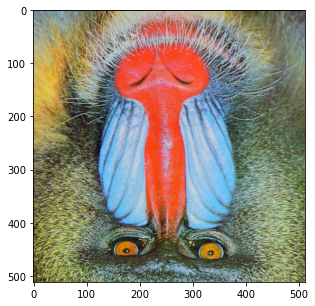

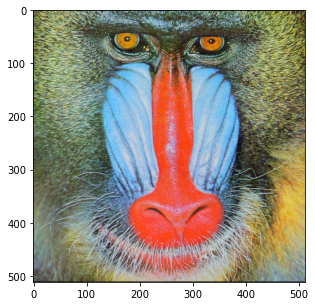

In [42]:
im = Image.open("baboon.png")

im_flip = ImageOps.flip(im)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

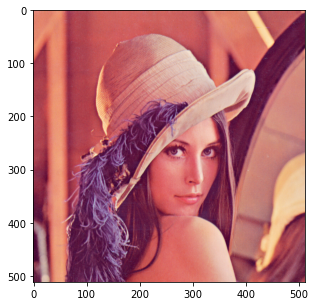

In [43]:
# Loads the image from the specified file
image = Image.open("lenna.png")
# Renders the image
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.show()

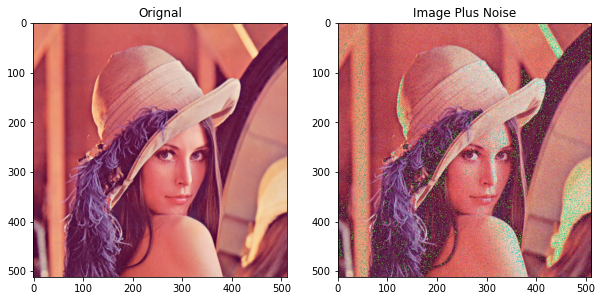

In [44]:
# Get the number of rows and columns in the image
rows, cols = image.size
# Creates values using a normal distribution with a mean of 0 and standard deviation of 15, the values are converted to unit8 which means the values are between 0 and 255
noise = np.random.normal(0,15,(rows,cols,3)).astype(np.uint8)
# Add the noise to the image
noisy_image = image + noise
# Creates a PIL Image from an array
noisy_image = Image.fromarray(noisy_image)
# Plots the original image and the image with noise using the function defined at the top
plot_image(image, noisy_image, title_1="Orignal", title_2="Image Plus Noise")

In [45]:
from PIL import ImageFilter

In [46]:
# Create a kernel which is a 5 by 5 array where each value is 1/36
kernel = np.ones((5,5))/36
# Create a ImageFilter Kernel by providing the kernel size and a flattened kernel
kernel_filter = ImageFilter.Kernel((5,5), kernel.flatten())

In [47]:
# Filters the images using the kernel
image_filtered = noisy_image.filter(kernel_filter)

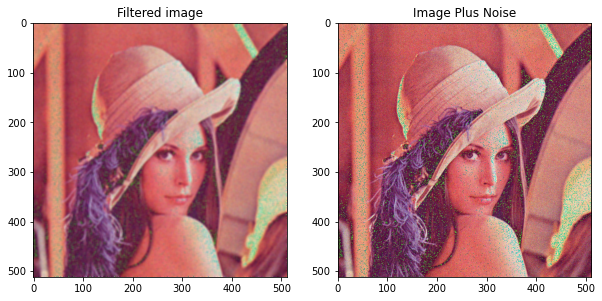

In [48]:
# Plots the Filtered and Image with Noise using the function defined at the top
plot_image(image_filtered, noisy_image,title_1="Filtered image",title_2="Image Plus Noise")

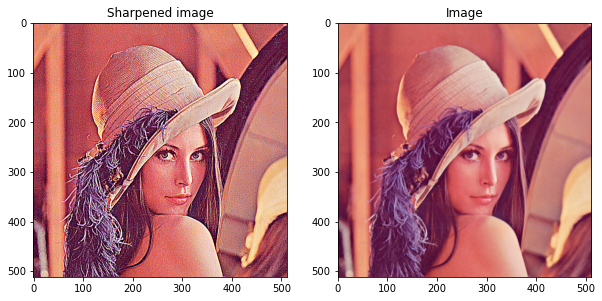

In [49]:
# Common Kernel for image sharpening
kernel = np.array([[-1,-1,-1], 
                   [-1, 9,-1],
                   [-1,-1,-1]])
kernel = ImageFilter.Kernel((3,3), kernel.flatten())
# Applys the sharpening filter using kernel on the original image without noise
sharpened = image.filter(kernel)
# Plots the sharpened image and the original image without noise
plot_image(sharpened , image, title_1="Sharpened image",title_2="Image")

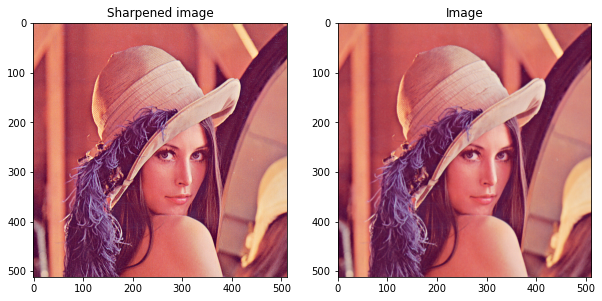

In [50]:
# Sharpends image using predefined image filter from PIL
sharpened = image.filter(ImageFilter.SHARPEN)
# Plots the sharpened image and the original image without noise
plot_image(sharpened , image, title_1="Sharpened image",title_2="Image")

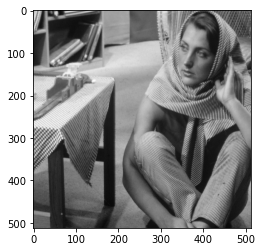

In [51]:
# Loads the image from the specified file
img_gray = Image.open('barbara.png')
# Renders the image from the array of data, notice how it is 2 diemensional instead of 3 diemensional because it has no color
plt.imshow(img_gray ,cmap='gray')

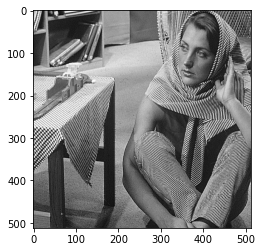

In [52]:
# Filters the images using EDGE_ENHANCE filter
img_gray = img_gray.filter(ImageFilter.EDGE_ENHANCE)
# Renders the enhanced image
plt.imshow(img_gray ,cmap='gray')

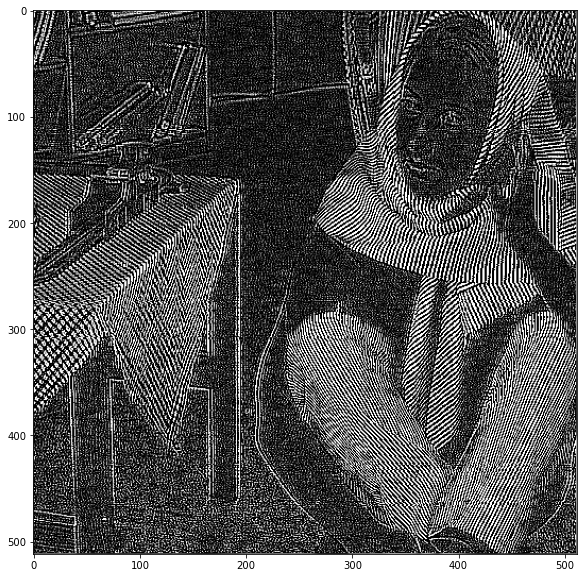

In [53]:
# Filters the images using FIND_EDGES filter
img_gray = img_gray.filter(ImageFilter.FIND_EDGES)
# Renders the filtered image
plt.figure(figsize=(10,10))
plt.imshow(img_gray ,cmap='gray')

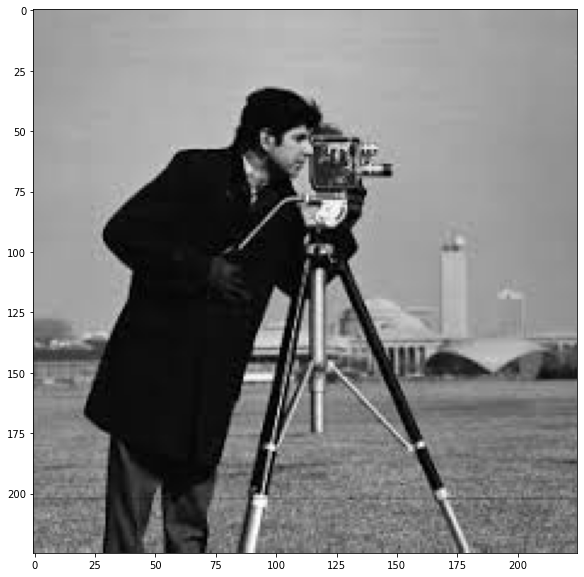

In [54]:
# Load the camera man image
image = Image.open("cameraman.jpeg")
# Make the image larger when it renders
plt.figure(figsize=(10,10))
# Renders the image
plt.imshow(image,cmap="gray")

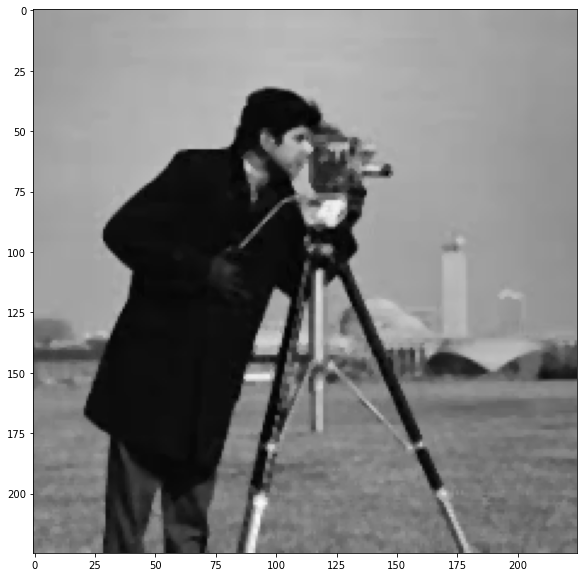

In [55]:
image = image.filter(ImageFilter.MedianFilter)
plt.figure(figsize=(10,10))
# Renders the image
plt.imshow(image,cmap="gray")